In [1]:
import pandas as pd
import sys

sys.path.append('../../')
from src.transform import load_json,transform_diff_avg,transform_diff_experiments
from src.plot_helpers import plot_experiment_range,plot_correlation_matrix,plot_boxplot

indoors_cols = load_json("../../json/locations.json")["wings_indoors"]

In [2]:
df = pd.read_csv('../../data/clean_data/all_sensors.csv',index_col=0,parse_dates=True)
df_air_indoor = pd.read_csv('../../data/clean_data/airwings.csv',index_col=0,parse_dates=True)

df_air_indoor = df_air_indoor.loc[(df_air_indoor['sensor'] == 'air_wings_indoor') | (df_air_indoor['sensor'] == 'air_wings_indoor_ref'), indoors_cols]

df_air_indoor.rename(columns={'device_id': 'sensor'}, inplace=True)
df_air_indoor['sensor'] = 'AWI_indoor_' + df_air_indoor['sensor'].astype(str)

df_air_indoor

/tmp/ipykernel_2039916/3833256816.py:1: DtypeWarning: Columns (6,26) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../../data/clean_data/all_sensors.csv',index_col=0,parse_dates=True)


,co2,tvoc,co,pm_1.0,pm_2.5,pm_10,temperature,humidity,pressure,sensor
datetime,,,,,,,,,,
2024-10-16 05:00:43,657.32,0.0,0.5,2.15,2.27,2.24,26.60,33.0,1010.26,AWI_indoor_2.0
2024-10-16 05:01:43,657.32,0.0,0.5,2.15,2.25,2.23,26.60,33.0,1010.28,AWI_indoor_2.0
2024-10-16 05:02:43,657.31,0.0,0.5,2.13,2.24,2.22,26.60,33.0,1010.30,AWI_indoor_2.0
2024-10-16 05:03:43,657.31,0.0,0.5,2.05,2.15,2.13,26.59,33.0,1010.30,AWI_indoor_2.0
2024-10-16 05:04:43,657.31,0.0,0.5,2.00,2.11,2.09,26.59,33.0,1010.31,AWI_indoor_2.0
...,...,...,...,...,...,...,...,...,...,...
2024-10-31 11:17:59,400.00,0.0,0.5,40.06,42.36,42.36,20.34,49.0,1010.60,AWI_indoor_316.0
2024-10-31 11:18:58,400.00,0.0,0.5,24.93,26.44,26.53,27.02,40.0,1015.51,AWI_indoor_316.0
2024-10-31 11:19:58,400.00,0.0,0.5,24.89,26.39,26.47,27.02,40.0,1015.49,AWI_indoor_316.0


In [4]:
pm_10_full = pd.concat([df_air_indoor[["pm_10","sensor"]],df[["pm_10","sensor"]]],axis=0)
pm_10_full.index.name = 'datetime'
pm_10_full



,pm_10,sensor
datetime,,
2024-10-16 05:00:43,2.24,AWI_indoor_2.0
2024-10-16 05:01:43,2.23,AWI_indoor_2.0
2024-10-16 05:02:43,2.22,AWI_indoor_2.0
2024-10-16 05:03:43,2.13,AWI_indoor_2.0
2024-10-16 05:04:43,2.09,AWI_indoor_2.0
...,...,...
2024-11-05 16:17:00,72.38,ref_sensor
2024-11-05 16:18:00,71.76,ref_sensor
2024-11-05 16:19:00,75.24,ref_sensor


In [5]:
pivot_full = pd.DataFrame()

for col in pm_10_full["sensor"].unique():
    
    pivot_full = pd.concat([pivot_full,pm_10_full.loc[pm_10_full['sensor'] == col].pivot_table(index='datetime', columns='sensor', values='pm_10')],axis=1)

pivot_full.resample('240s').mean()['2024-10-16 05:00:43':'2024-10-20 23:56:17']

sensor,AWI_indoor_2.0,AWI_indoor_3.0,AWI_indoor_4.0,AWI_indoor_5.0,AWI_indoor_6.0,AWI_indoor_7.0,AWI_indoor_8.0,AWI_indoor_9.0,AWI_indoor_10.0,AWI_indoor_11.0,...,AWI_indoor_13.0,AWI_indoor_14.0,AWI_indoor_15.0,AWI_indoor_316.0,inbiot,kaiterra,LS_168,LS_169,smart_sense,ref_sensor
datetime,,,,,,,,,,,,,,,,,,,,,
2024-10-16 05:04:00,2.1175,6.61,56.1275,50.830000,51.6925,59.7750,49.8400,51.1600,56.0225,51.0500,...,50.7925,47.7275,54.7750,NaN,40.0,100.00,53.681250,51.381458,60.425,50.9900
2024-10-16 05:08:00,2.2625,6.61,55.4800,51.002500,52.1375,57.3450,49.2375,50.9300,56.1225,51.4200,...,50.6150,47.5700,53.9200,53.47,NaN,102.25,52.961458,51.615833,59.900,51.0400
2024-10-16 05:12:00,2.2750,6.61,54.5825,51.073333,51.6250,57.7350,49.7150,49.9775,54.4925,50.8725,...,50.7175,47.3125,53.9775,52.62,39.0,99.50,51.892292,50.846458,58.475,50.2350
2024-10-16 05:16:00,2.2775,6.61,53.3025,50.485000,51.5400,57.5225,49.8450,50.3150,55.1050,50.8200,...,50.3500,47.8625,53.2775,52.55,NaN,101.50,52.766875,50.516250,58.800,49.9800
2024-10-16 05:20:00,2.1675,6.61,53.7400,51.000000,50.9425,57.5425,49.8825,49.8125,55.0800,50.4775,...,50.8050,47.0100,53.2425,52.48,NaN,100.75,51.973750,50.326042,57.750,50.1625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-20 23:40:00,8.5575,6.61,39.3350,36.852500,37.9150,41.5125,37.2000,36.2725,39.6800,37.0100,...,37.6075,34.9825,39.2350,38.25,NaN,85.00,40.031042,37.103333,45.050,40.3675
2024-10-20 23:44:00,8.7250,6.61,39.2050,37.080000,38.1450,41.7975,36.5725,36.9250,39.5950,37.5725,...,37.4675,35.2350,39.4875,38.35,NaN,83.25,40.117500,37.855625,42.900,41.4075
2024-10-20 23:48:00,8.4800,6.61,39.6375,36.737500,38.1225,41.9150,36.9075,37.3050,39.4150,37.2600,...,37.6375,35.2250,40.0925,38.97,31.0,84.00,39.580625,38.216667,42.275,41.0700


## Correlation matrix

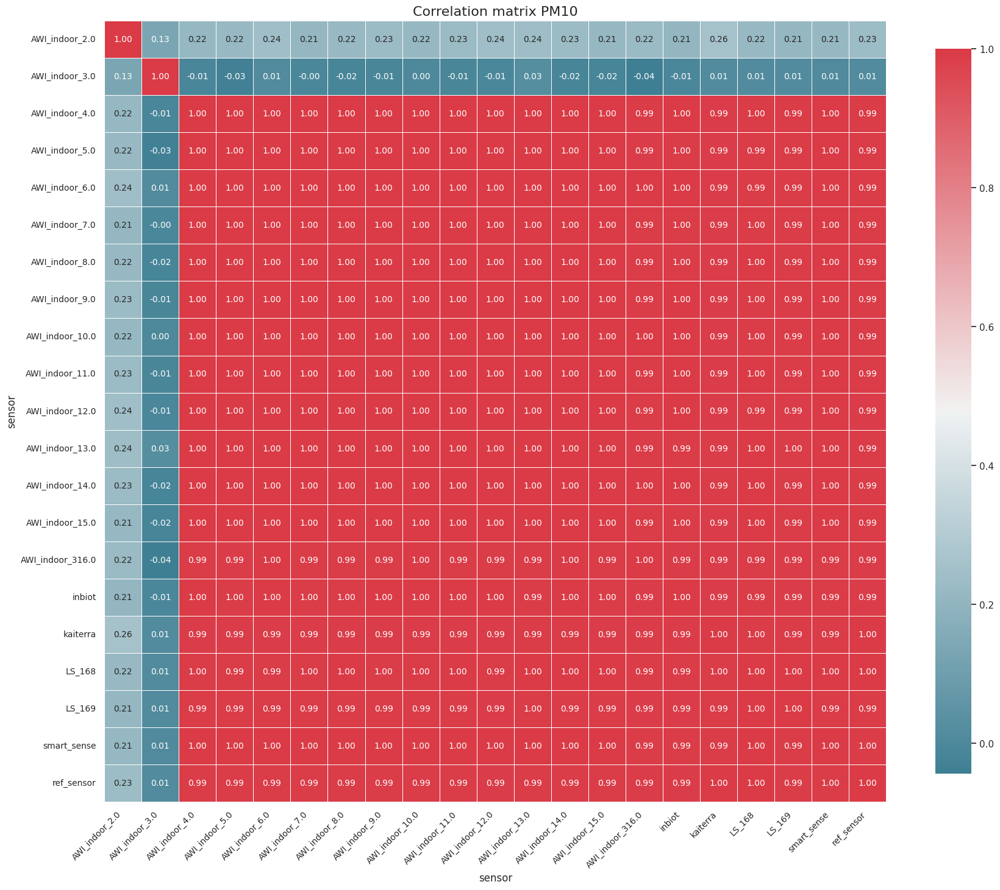

In [6]:
plot_correlation_matrix(pivot_full.resample('240s').mean()['2024-10-16 05:00:43':'2024-10-20 23:56:17'].corr(),"Correlation matrix PM10")

## Box plots

In [7]:
plot_boxplot(pivot_full.resample('240s').mean()['2024-10-16 05:00:43':'2024-10-20 23:56:17'],col_names=['AWI_indoor_2.0','AWI_indoor_15.0','AWI_indoor_316.0','inbiot','LS_168','LS_169','smart_sense','ref_sensor'])

## Time series plot

In [13]:
plot_experiment_range(pivot_full.resample('240s').mean()['2024-10-16 05:00:43':'2024-11-02 23:56:17'],col_names=['AWI_indoor_316.0','inbiot','kaiterra','LS_168','LS_169','smart_sense','ref_sensor'])

In [9]:
diff_df = transform_diff_avg(pivot_full.resample('240s').mean())
diff_df

/home/usr1_tt/collocation_study/notebooks/all_sensors/../../src/transform.py:16: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



,Doors opened,Hall opened,Indoor Room Air Exchange,Rowing CD,Rowing OD,Human Presence,Diffuser (Water),Diffuser (Oil),Car (3m),Car (5m),...,Heater,Aquarium Pump,Tar (Neighbor Burning),Central Heating,VOC Tubes - Car,VOC Tubes - Diffuser (Oil),VOC Tubes - Gas Burner,VOC Tubes - Candle,Diffuser (Repeat),Boiling Water (Gas)
sensor,,,,,,,,,,,,,,,,,,,,,
AWI_indoor_2.0,8.731349e+00,-7.162857e-01,0.182417,-0.471635,0.687736,-3.179603e-01,4.866274e-01,-9.359643e-01,1.436154e+00,-2.932162,...,2.179214,-1.829738,0.912682,-0.887514,-6.439196,-0.953037,-8.889437,6.722977,0.242624,0.433883
AWI_indoor_3.0,1.387779e-15,2.775558e-15,0.000000,0.000000,0.000000,2.523234e-15,2.775558e-15,2.775558e-15,2.220446e-14,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AWI_indoor_4.0,-1.773844e+01,-3.587274e+00,-11.823785,0.390857,-20.539682,-1.438049e+00,9.171938e+00,5.088329e+00,-3.455977e+01,-14.061295,...,0.341774,0.000000,0.000000,0.000000,-1.209537,0.049135,1.024252,-0.027415,0.000000,0.000000
AWI_indoor_5.0,-1.580254e+01,-2.310995e+00,-13.115670,-0.718308,-20.766958,-1.022936e+00,1.102434e+01,1.307324e+01,-3.112870e+01,-16.571200,...,0.404991,0.000000,0.000000,0.000000,-1.344050,0.907754,3.306219,0.042584,0.000000,0.000000
AWI_indoor_6.0,-1.848699e+01,-3.200409e+00,-11.841968,0.000000,-29.006977,-9.949167e-01,1.058480e+01,1.433220e+01,-3.188642e+01,-17.105971,...,0.352321,0.000000,0.000000,0.000000,-1.046574,0.672293,3.266765,-0.181700,0.000000,0.000000
AWI_indoor_7.0,-1.837749e+01,-3.526584e+00,-12.246285,0.170987,-31.254905,-1.293048e+00,1.168038e+01,1.319457e+01,-3.723814e+01,-17.762399,...,0.304760,0.000000,0.000000,0.000000,-1.374848,0.711184,0.385057,-0.312625,0.000000,0.000000
AWI_indoor_8.0,-1.559998e+01,-3.289158e+00,-11.521953,1.414668,-30.318597,-1.346275e+00,1.170372e+01,1.538457e+01,-3.341582e+01,-15.478983,...,0.367552,0.000000,0.000000,0.000000,-1.512745,0.646192,0.718316,-0.230612,0.000000,0.000000
AWI_indoor_9.0,-1.986057e+01,-3.211463e+00,-11.359897,-0.572055,-30.051029,-1.233087e+00,9.208222e+00,1.298138e+01,-3.571341e+01,-15.336414,...,0.173490,0.000000,0.000000,0.000000,-1.679211,0.550099,1.173178,-0.001861,0.000000,0.000000
AWI_indoor_10.0,-1.812251e+01,-3.255605e+00,-11.440867,-0.466836,-19.321266,-1.144514e+00,9.347501e+00,1.264282e+01,-3.646970e+01,-19.267324,...,0.262987,0.000000,0.000000,0.000000,-1.561573,0.583866,0.875187,-0.543795,0.000000,0.000000


### Correlation matrix for diff DataFrame

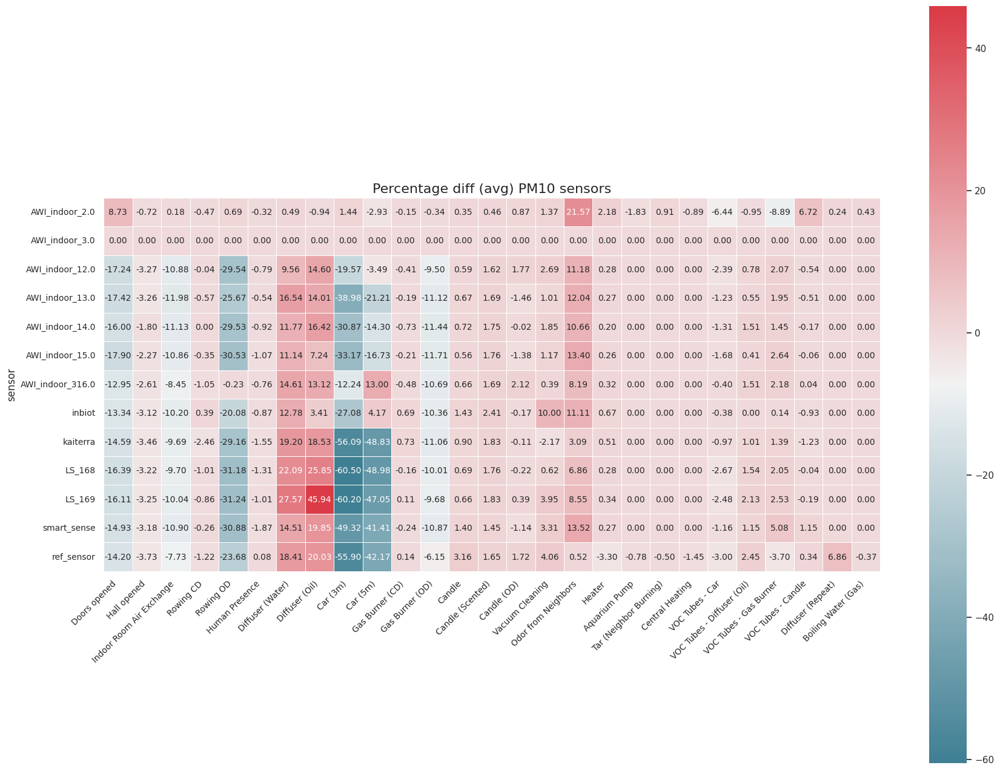

In [10]:
plot_correlation_matrix(diff_df.drop(['AWI_indoor_4.0','AWI_indoor_5.0','AWI_indoor_6.0','AWI_indoor_7.0','AWI_indoor_8.0','AWI_indoor_9.0','AWI_indoor_10.0','AWI_indoor_11.0']),title="Percentage diff (avg) PM10 sensors")

###

In [11]:
df_diff_exp_data = transform_diff_experiments(pivot_full.resample('240s').mean())
df_diff_exp_data

/home/usr1_tt/collocation_study/notebooks/all_sensors/../../src/transform.py:37: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



sensor,AWI_indoor_2.0,AWI_indoor_3.0,AWI_indoor_4.0,AWI_indoor_5.0,AWI_indoor_6.0,AWI_indoor_7.0,AWI_indoor_8.0,AWI_indoor_9.0,AWI_indoor_10.0,AWI_indoor_11.0,...,AWI_indoor_13.0,AWI_indoor_14.0,AWI_indoor_15.0,AWI_indoor_316.0,inbiot,kaiterra,LS_168,LS_169,smart_sense,ref_sensor
datetime,,,,,,,,,,,,,,,,,,,,,
2024-10-16 09:16:00,2.941176,2.220446e-14,-9.462876,0.000000,-9.125418,-5.059966,0.000000,-10.606836,-12.739268,-12.475581,...,-8.367044,0.000000,-9.764950,-1.893939,0.000000,-34.278351,-36.252319,-35.874514,-24.521584,-31.927109
2024-10-16 09:20:00,2.337662,0.000000e+00,-42.062975,-24.439050,-47.037485,-42.577740,-25.633760,-40.228569,-38.849253,-38.143616,...,-35.810463,-26.127669,-45.111903,-66.681808,0.000000,-63.921569,-66.179159,-66.019796,-63.620283,-59.354602
2024-10-16 09:24:00,-3.680203,-1.110223e-14,-64.925042,-68.133580,-65.255293,-63.734379,-68.291506,-48.940245,-66.609589,-53.378126,...,-66.446011,-59.560983,-58.728006,0.000000,-55.263158,-56.521739,-49.803959,-51.572327,-60.777958,-46.878383
2024-10-16 09:28:00,0.131752,0.000000e+00,-42.134547,-51.856095,-31.421744,-44.804805,-44.404390,-48.612153,0.000000,-47.344542,...,-43.146298,-59.046891,-42.787860,-62.235855,0.000000,-22.500000,-17.146324,-18.889470,-23.553719,-21.059783
2024-10-16 09:32:00,1.381579,0.000000e+00,0.000000,0.000000,-18.074913,-18.307943,-20.806916,-31.715328,-40.912647,-31.158135,...,-20.820189,-17.112632,-20.139459,-16.064982,-76.470588,3.225806,-2.617729,-0.262727,-11.351351,31.196213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-02 19:28:00,-1.155293,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-2.317291
2024-11-02 19:32:00,3.180212,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.294056
2024-11-02 19:36:00,0.026344,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.714067


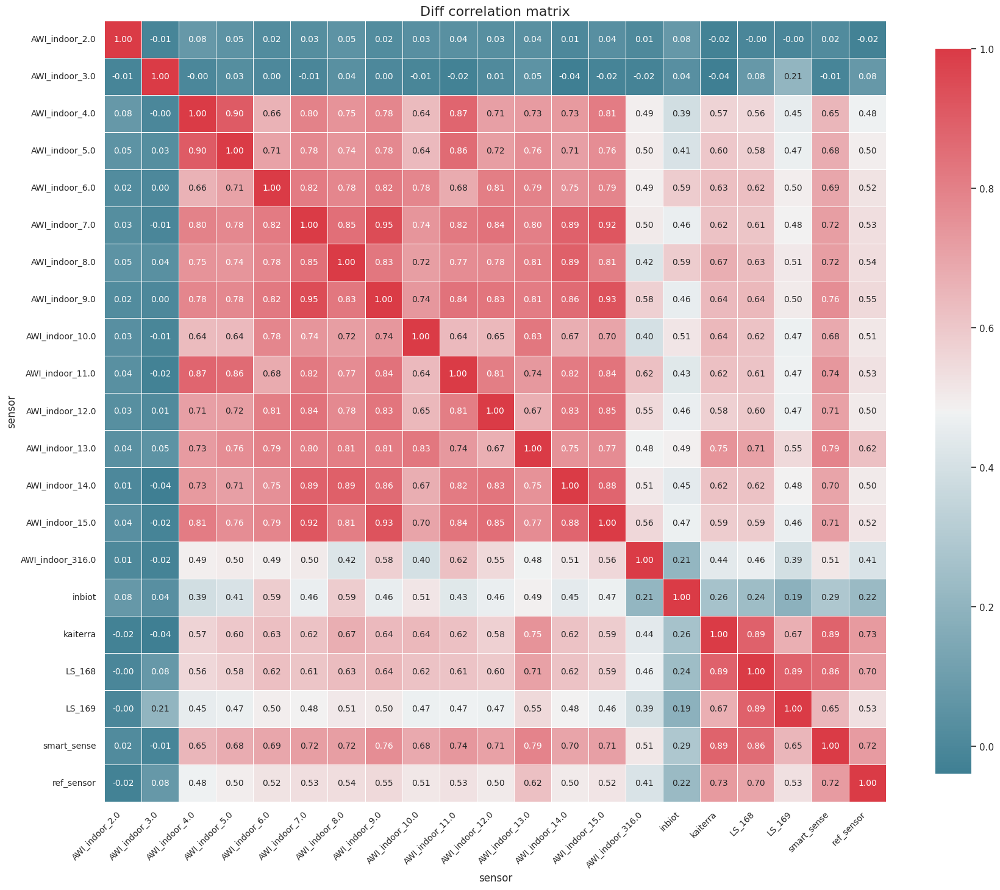

In [12]:
plot_correlation_matrix(df_diff_exp_data.corr(),title="Diff correlation matrix")